# Motion Projections

We begin by loading a photon cube corresponding to a falling die. You can download the photon cube for this scene [here](https://github.com/cpsiff/SPAD-ICCP-Summer-School/releases/download/data/falling_die_photon_cube.npy) and place it under `data/`. (If you download the file elsewhere, make sure to modify the file path in `np.load` below.)

In [1]:
import numpy as np
from einops import rearrange
import mediapy as media
import torch

device = torch.device("cuda") if torch.cuda.is_available() else torch.device("cpu")

# Load without memmap
# Of shape T, H, W//8. Bitpacked
photon_cube = np.load("data/falling_die_photon_cube.npy")
photon_cube = rearrange(
    np.unpackbits(photon_cube, axis=-1), "time height width -> height width time"
)
photon_cube = torch.from_numpy(photon_cube).to(device).float()
photon_cube.shape

torch.Size([252, 496, 2000])

Let's visualize the photon cube. We'll display a single binary frame and the (virtual) long exposure, which is obtained by computing a temporal average of the photon cube.

Single 1-bit frame,(Virtual) Long exposure

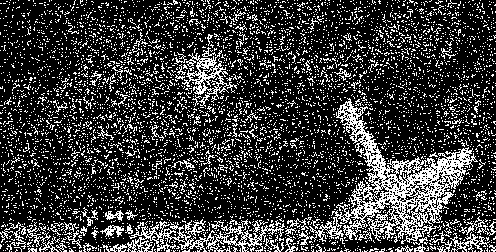
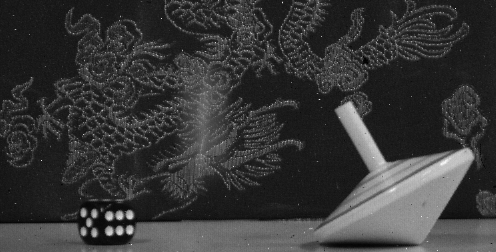

In [2]:
media.show_images(
    (
        photon_cube[..., 0].numpy(force=True),
        photon_cube.mean(axis=-1).numpy(force=True),
    ),
    titles=("Single 1-bit frame", "(Virtual) Long exposure"),
)

# Hardcoded Direction

Let's first compute the motion projection for a hardcoded direction vector.
Given a direction vector, we want to compute the linear shifts such that the shift at time t=0 is -direction_vector/2 (in pixels), at t=T/2, there is no shift, and at t=T, the shift is direction_vector/2.

Complete the function below. The output of the algorithm is a set of shifts in pixel space (i, j) for each time step 0 <= t <= T.

In [3]:
from jaxtyping import Int
from torch import Tensor


def get_linear_direction(
    num_time_step: int,
    direction_vector: tuple[float, float],
) -> Int[Tensor, "num_time_step 2"]:
    """
    Computed by rounding floating point numbers.
    A more sophisticated approach would be to use discrete line drawing algorithms.

    :param num_time_step: Time steps
    :param direction_vector: orientation vector
    :return: line_voxel_ll (num_directions, t, 2)
    """
    # TODO: output a spatiotemporal trajectory r(t) -> (x, y). i.e., specify (x,y) for every time index.
    # the trajectory is linear, such that there is no shift in the middle of the cube,
    # and the shifts on either end (start, finish) are -direction_vector/2 and direction_vector/2, respectively.

    return linear_dir

In [4]:
height, width, num_time_step = photon_cube.shape
direction_vector = (94, 0)
linear_dir = get_linear_direction(num_time_step, direction_vector)
linear_dir.shape

torch.Size([2000, 2])

## Motion Projections by rolling

Let's now compute motion projections by rolling the photon cube, slice by slice according to the shifts stipulated by `linear_dir`.

Computing a single motion projection: 100%|██████████| 2000/2000 [00:04<00:00, 491.13it/s]


""

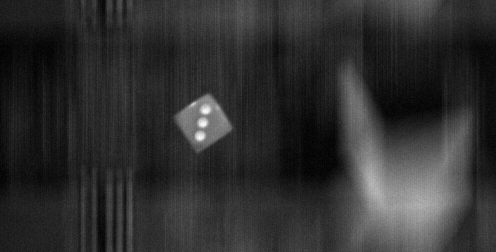

In [5]:
from tqdm import tqdm_notebook
import mediapy as media

motion_projection = torch.zeros_like(photon_cube[..., 0])
for t_index in tqdm_notebook(
    range(num_time_step), desc="Computing a single motion projection"
):
    # TODO exercise: shift the incoming slice of the photon cube (photon_cube[..., t_index]) as per the shift specified in linear_dir[t_index].
    # Hint: you may have to look up the docs for torch.roll to ensure you supply the correct shifts to the method!
    motion_projection += rolled_photon_slice / num_time_step

media.show_image(motion_projection.numpy(force=True))

Notice the wrap-around artifacts? That's because we used `np.roll` to implement a motion projection, which is the sum of shifted frames, without checking for boundary conditions.

Let's fix this by zero-padding the tensor appropriately and keeping track of valid pixel integrations.

Computing a single motion projection: 100%|██████████| 2000/2000 [00:03<00:00, 515.39it/s]


""

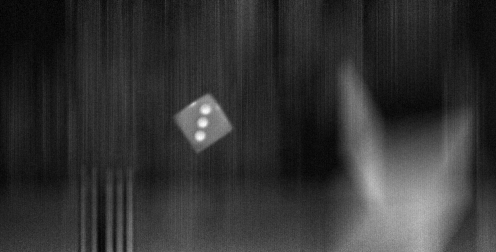

In [59]:
from torch.nn import functional as F

# TODO: pad the photon cube before rolling such that we do not encounter any wrap-around issues
# Use a constant padding with value -1 to spot the invalid rolls.
padded_photon_cube = F.pad(photon_cube, (0, 0, *pad_w, *pad_h), value=-1)
padded_h, padded_w, _ = padded_photon_cube.shape

padded_motion_projection = torch.zeros(padded_h, padded_w).to(device)
valid_shifts = torch.zeros_like(padded_motion_projection)
for t_index in tqdm_notebook(
    range(num_time_step), desc="Computing a single motion projection"
):
    # TODO: fill this
    rolled_photon_slice = ...
    padded_motion_projection += rolled_photon_slice.clamp(min=0)
    valid_shifts += (rolled_photon_slice >= 0).float()

padded_motion_projection /= valid_shifts.clamp(min=1)
motion_projection = padded_motion_projection[
    pad_h[0] : padded_h - pad_h[1], pad_w[0] : padded_w - pad_w[1]
]
media.show_image(motion_projection.numpy(force=True))

## Motion Sweep

Let's produce an animation where we sweep across motion projections that result from using direction vectors ranging from no shift (i.e., shift of (0, 0)) to the shift specified by `direction_vector`.

To produce this animation, we shall start by vectorizing our code, so as to compute the linear shifts for more than one direction vector in parallel.

In [68]:
from jaxtyping import Float


def get_linear_direction_vectorized(
    num_time_step: int,
    direction_vector: Float[Tensor, "num_direction 2"],
) -> Int[Tensor, "num_direction num_time_step 2"]:
    """
    Computed by rounding floating point numbers.
    A more sophisticated approach would be to use discrete line drawing algorithms.

    :param num_time_step: Time steps
    :param direction_vector: orientation vector
    :return: line_voxel_ll (num_directions, t, 2)
    """
    # TODO: write a vectorized version of the previous snippet that produced a linear trajectory (vectorized over num_directions).

    return linear_dir

In [71]:
direction_vector = torch.tensor(direction_vector).float()
direction_magnitude = torch.linalg.norm(direction_vector)
direction_unit_vector = direction_vector / direction_magnitude
num_direction = 32
direction_vector_ll = torch.linspace(
    0, direction_magnitude, steps=num_direction
).reshape(-1, 1) * direction_unit_vector.reshape(1, -1)

linear_dir_ll = get_linear_direction_vectorized(num_time_step, direction_vector_ll)

# For an animation that goes back and forth, we concatenate the (reversed) set of directions that are being swept across
linear_dir_ll = torch.cat((linear_dir_ll, torch.flip(linear_dir_ll, dims=(0,))), dim=0)
linear_dir_ll.shape

/var/folders/8f/ntspldbn0czdhgwgfgz_y50h0000gn/T/ipykernel_25118/2535855302.py:1: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  direction_vector = torch.tensor(direction_vector).float()
/var/folders/8f/ntspldbn0czdhgwgfgz_y50h0000gn/T/ipykernel_25118/3062398933.py:21: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  * rearrange(torch.tensor(direction_vector), "num_direction c -> num_direction 1 c")


torch.Size([64, 2000, 2])

In [75]:
def motion_projection_from_photon_cube(
    photon_cube: Float[Tensor, "height width num_time_step"],
    direction_vector_ll: Float[Tensor, "num_direction num_time_step 2"],
):
    """
    :param photon_cube: Shape (h, w, time)
    :param direction_vector_ll: Shape (num_directions, time, 2)
        represents rasterized trajectory
    :return: direction projection
        Shape (h, w, num_directions)
    """
    h, w, t = photon_cube.shape
    num_direction, _, _ = direction_vector_ll.shape

    # TODO: estimate pad_h and pad_w as the maximum extents we need to pad the photon cube by

    padded_photon_cube = F.pad(photon_cube, (0, 0, *pad_w, *pad_h), value=-1)
    padded_h, padded_w, _ = padded_photon_cube.shape

    padded_motion_projection = torch.zeros(num_direction, padded_h, padded_w).to(device)
    valid_shifts = torch.zeros_like(padded_motion_projection)
    for t_index in tqdm_notebook(
        range(num_time_step), desc=f"Computing {num_direction} motion projections"
    ):
        for direction_idx in range(num_direction):
            # TODO: calculate rolled_photon_slice. Very similar to the rolling operation before, except now we have one more axis being indexed.
            padded_motion_projection[direction_idx] += rolled_photon_slice.clamp(min=0)
            valid_shifts[direction_idx] += (rolled_photon_slice >= 0).float()

    padded_motion_projection /= valid_shifts.clamp(min=1)
    motion_projection_ll = padded_motion_projection[
        :, pad_h[0] : padded_h - pad_h[1], pad_w[0] : padded_w - pad_w[1]
    ]

    return motion_projection_ll

In [76]:
motion_projection_ll = motion_projection_from_photon_cube(photon_cube, linear_dir_ll)

Computing 64 motion projections: 100%|██████████| 2000/2000 [03:42<00:00,  8.97it/s]


Motion Sweep

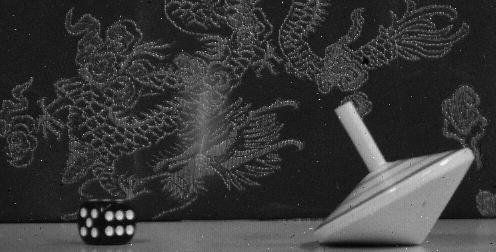

In [77]:
media.show_video(
    [
        motion_projection_ll[e].numpy(force=True)
        for e in range(len(motion_projection_ll))
    ],
    title="Motion Sweep",
    codec="gif",
    fps=10,
)

## Finding direction vectors

So far, we've been working with a hardcoded direction vector. But how do we go about finding this vector in the first place? In the final part of this activity, we shall see how to obtain a direction vector using optical flow information.

A dense optical flow map, such as one obtained using a state-of-the-art learned flow predictor such as RAFT, provides us a reasonable estimate of (linear) object displacement across the photon cube. We can use this information to (loosely) set a motion projection direction vector.

In [78]:
from torchvision.models.optical_flow import raft_large, Raft_Large_Weights

raft_weights = Raft_Large_Weights.DEFAULT
raft_model = raft_large(weights=raft_weights).to(device)
raft_model = raft_model.to(device)
raft_transforms = raft_weights.transforms()

We shall estimate optical flow by feeding RAFT (virtual) short exposures from the start and end of the sequence.

We shall also switch to a new photon cube, corresponding to a traffic sequence shot in daytime, for this exercise. You can download the photon cube for this scene [here](https://github.com/cpsiff/SPAD-ICCP-Summer-School/releases/download/data/traffic_photon_cube.npy) and place it under `data/`. (If you download the file elsewhere, make sure to modify the file path in `np.load` below.)

In [80]:
from torchvision.utils import flow_to_image
from einops import repeat
from math import ceil

# Load without memmap
# Of shape T, H, W//8. Bitpacked
photon_cube = np.load("data/traffic_photon_cube.npy")
photon_cube = rearrange(
    np.unpackbits(photon_cube, axis=-1), "time height width -> height width time"
)[..., ::4]
height, width, num_time_step = photon_cube.shape

# Pad to multiple of 8
photon_cube = np.pad(
    photon_cube,
    ((0, ceil(height / 8) * 8 - height), (0, ceil(width / 8) * 8 - width), (0, 0)),
)
photon_cube = torch.from_numpy(photon_cube).float().to(device)
height, width, num_time_step = photon_cube.shape

short_exposure_frames = 50
start_frame = photon_cube[
    ...,
    :short_exposure_frames,
].mean(axis=-1)
end_frame = photon_cube[..., -short_exposure_frames:].mean(axis=-1)
long_exposure = photon_cube.mean(axis=-1)

# Convert to RGB
start_frame = repeat(start_frame, "h w -> 1 c h w", c=3)
end_frame = repeat(end_frame, "h w -> 1 c h w", c=3)

with torch.inference_mode():
    start_frame, end_frame = raft_transforms(start_frame, end_frame)
    flow_pred = raft_model(start_frame, end_frame)[-1].squeeze(dim=0).detach()

    # Show flow_pred
    flow_img = rearrange(flow_to_image(flow_pred), "c h w -> h w c")
    alpha = 0.7
    flow_img = alpha * flow_img + (1 - alpha) * repeat(
        long_exposure, "h w -> h w c", c=3
    )
    flow_img = flow_img.to(torch.uint8)

Predicted optical flow

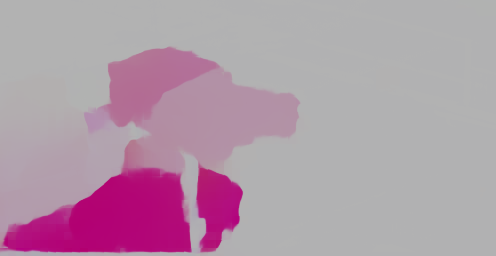

In [81]:
media.show_image(flow_img.numpy(force=True), title="Predicted optical flow")

Now let's sweep from zero-shift to the maximum shift predicted by optical flow. This should allow us to bring all points in the scene into a state of near-zero (linear) blur.

In [82]:
num_direction = 32

# TODO: determine 32 direction vectors whose magnitude goes from 0...flow_pred.norm(dim=0).max()
direction_vector_ll = ...

linear_dir_ll = get_linear_direction_vectorized(num_time_step, direction_vector_ll)
linear_dir_ll = torch.cat((linear_dir_ll, torch.flip(linear_dir_ll, dims=(0,))), dim=0)
linear_dir_ll.shape

/var/folders/8f/ntspldbn0czdhgwgfgz_y50h0000gn/T/ipykernel_25118/3062398933.py:21: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  * rearrange(torch.tensor(direction_vector), "num_direction c -> num_direction 1 c")


torch.Size([64, 1500, 2])

In [46]:
motion_projection_ll = motion_projection_from_photon_cube(photon_cube, linear_dir_ll)

Computing 64 motion projections: 100%|██████████| 1500/1500 [02:20<00:00, 10.69it/s]


Motion Sweep

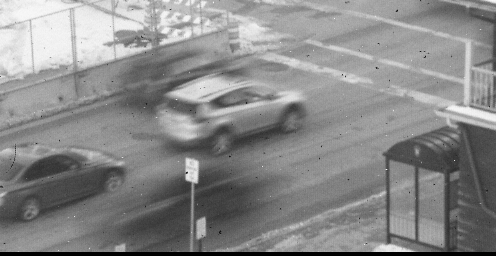

In [47]:
media.show_video(
    [
        motion_projection_ll[e].numpy(force=True)
        for e in range(len(motion_projection_ll))
    ],
    title="Motion Sweep",
    codec="gif",
    fps=10,
)